<a href="https://colab.research.google.com/github/shake345/Python100knock/blob/main/5%E7%AB%A0_%E5%8A%A0%E5%B7%A5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# 下記セルを実行すると、authorization codeの入力を求められます。
# 出力されたリンク先をクリックし、Googleアカウントにログインし、
# authorization codeをコピーし、貼り付けをおこなってください。
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
project = '100knock-process-visualization'
chapter = 5
os.chdir(f'/content/drive/MyDrive/{project}/chapter-{chapter}/')

# ５章 画像データの加工・可視化を行う１０本ノック

## ノック６１：画像ファイルを読み込んで表示してみよう

In [3]:
import cv2
img = cv2.imread('data/sample.jpg')
img

array([[[ 8, 10,  4],
        [ 8, 10,  4],
        [ 8, 10,  4],
        ...,
        [47, 69, 45],
        [46, 66, 47],
        [45, 65, 46]],

       [[ 8, 10,  4],
        [ 8, 10,  4],
        [ 8, 10,  4],
        ...,
        [50, 72, 48],
        [49, 70, 48],
        [48, 69, 47]],

       [[ 9, 12,  3],
        [ 9, 12,  3],
        [ 9, 12,  3],
        ...,
        [52, 74, 49],
        [50, 72, 48],
        [48, 70, 46]],

       ...,

       [[20, 48,  5],
        [17, 47,  4],
        [15, 46,  1],
        ...,
        [27, 32, 31],
        [21, 21, 27],
        [15, 14, 23]],

       [[18, 49,  4],
        [17, 48,  3],
        [15, 47,  0],
        ...,
        [27, 31, 25],
        [20, 22, 22],
        [17, 16, 18]],

       [[18, 50,  3],
        [16, 48,  1],
        [12, 46,  0],
        ...,
        [26, 32, 21],
        [21, 22, 18],
        [17, 17, 17]]], dtype=uint8)

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

## ノック６２：画像データの中身を確認しよう

In [5]:
img.shape

(3456, 5184, 3)

In [6]:
print(img[0])
print(img[0].shape)

[[ 8 10  4]
 [ 8 10  4]
 [ 8 10  4]
 ...
 [47 69 45]
 [46 66 47]
 [45 65 46]]
(5184, 3)


In [7]:
print(img[:,0])
print(img[:,0].shape)

[[ 8 10  4]
 [ 8 10  4]
 [ 9 12  3]
 ...
 [20 48  5]
 [18 49  4]
 [18 50  3]]
(3456, 3)


In [8]:
print(img[:,:,0])
print(img[:,:,0].shape)

[[ 8  8  8 ... 47 46 45]
 [ 8  8  8 ... 50 49 48]
 [ 9  9  9 ... 52 50 48]
 ...
 [20 17 15 ... 27 21 15]
 [18 17 15 ... 27 20 17]
 [18 16 12 ... 26 21 17]]
(3456, 5184)


## ノック６３：画像データを切り出してみよう

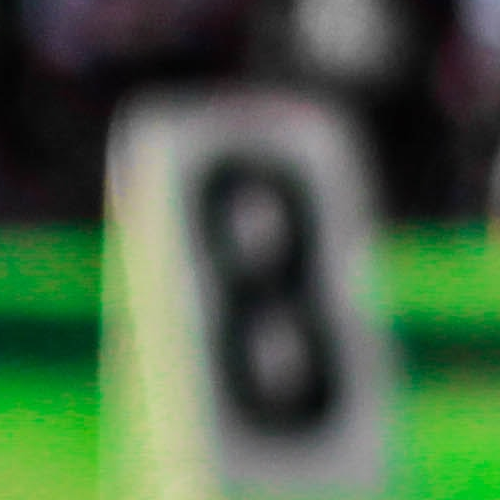

In [9]:
img_extract = img[700:1200,300:800,:]
cv2_imshow(img_extract)

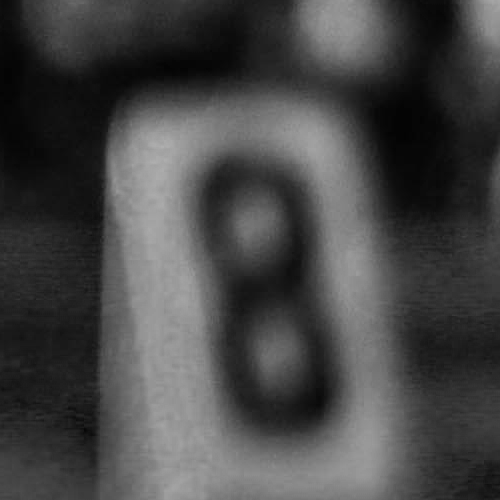

In [10]:
cv2_imshow(img_extract[:,:,0])

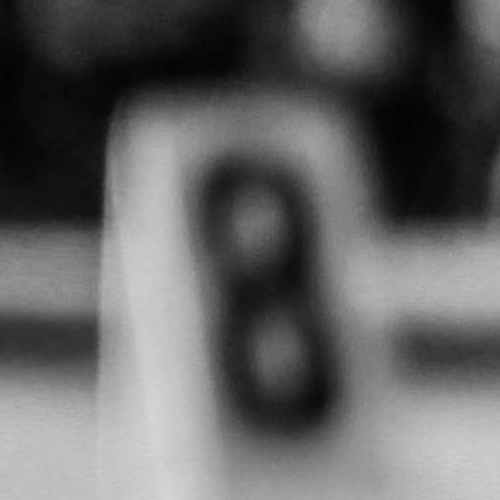

In [11]:
cv2_imshow(img_extract[:,:,1])

## ノック６４：カラーヒストグラムを可視化してみよう

In [12]:
hist_b = cv2.calcHist([img],channels=[0],mask=None,histSize=[256],ranges=[0,256])
print(hist_b.shape)
hist_b[:5]

(256, 1)


array([[316922.],
       [163325.],
       [130665.],
       [ 97818.],
       [ 81594.]], dtype=float32)

## ノック６５：RGB変換を行って画像を表示してみよう

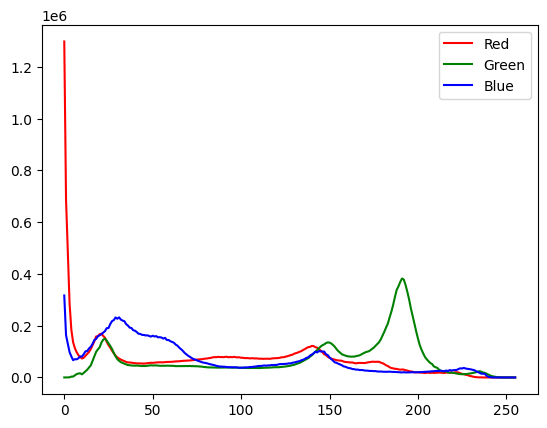

In [13]:
hist_g = cv2.calcHist([img],channels=[1],mask=None,histSize=[256],ranges=[0,256])
hist_r = cv2.calcHist([img],channels=[2],mask=None,histSize=[256],ranges=[0,256])

import matplotlib.pyplot as plt
plt.plot(hist_r,color='r',label='Red')
plt.plot(hist_g,color='g',label='Green')
plt.plot(hist_b,color='b',label='Blue')
plt.legend()
plt.show()

In [14]:
img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img_rgb.shape

(3456, 5184, 3)

In [ ]:
cv2_imshow(img_rgb)

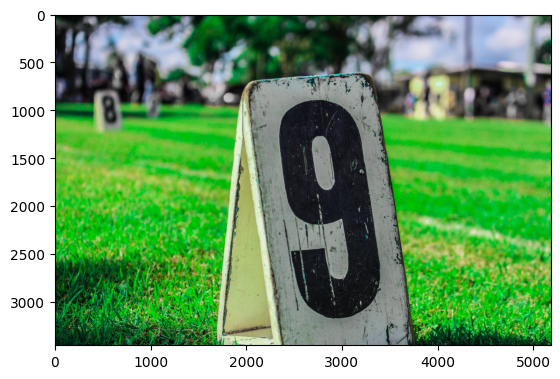

In [16]:
plt.imshow(img_rgb)

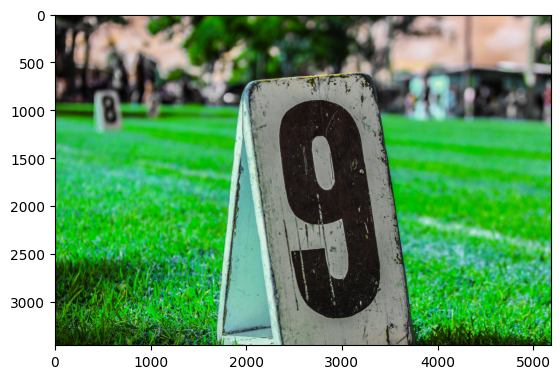

In [17]:
plt.imshow(img)

## ノック６６：画像のサイズを変更してみよう

In [18]:
height,width,channels = img.shape
print(width,height)

5184 3456


(300, 500, 3)


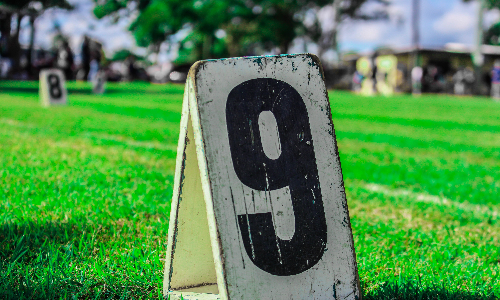

In [19]:
img_resized = cv2.resize(img,(500,300))
print(img_resized.shape)
cv2_imshow(img_resized)

(500, 300, 3)


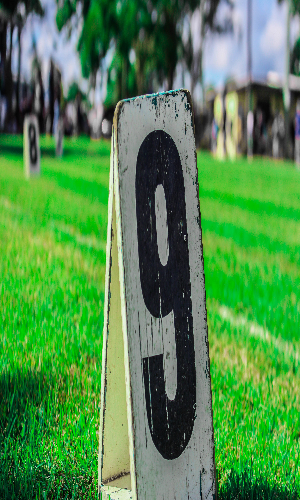

In [20]:
img_resized = cv2.resize(img,(300,500))
print(img_resized.shape)
cv2_imshow(img_resized)

(346, 518, 3)


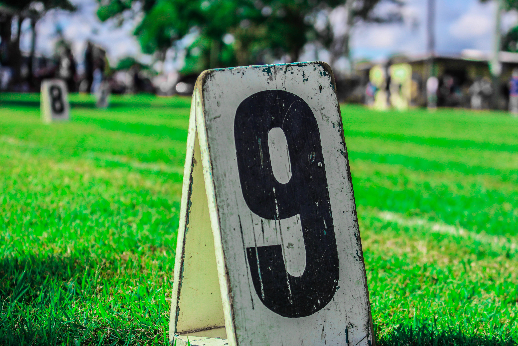

In [21]:
img_resized = cv2.resize(img,None,fx=0.1,fy=0.1)
print(img_resized.shape)
cv2_imshow(img_resized)

(519, 777, 3)


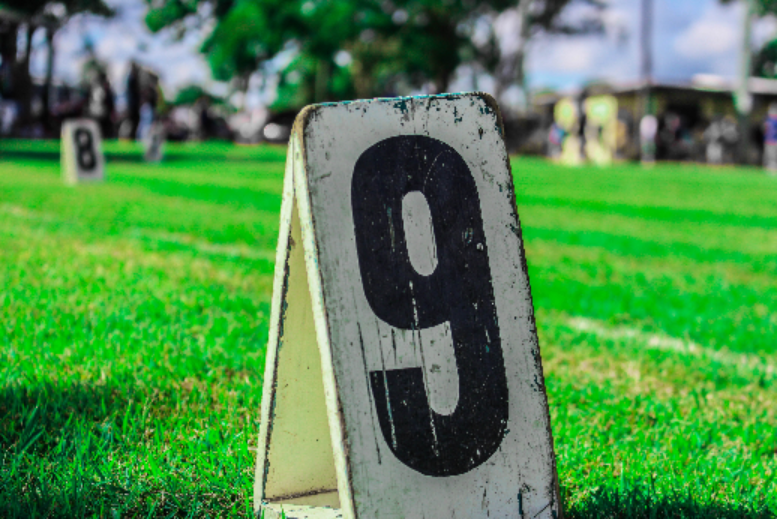

In [22]:
img_resized_2 = cv2.resize(img_resized,None,fx=1.5,fy=1.5)
print(img_resized_2.shape)
cv2_imshow(img_resized_2)

(519, 777, 3)


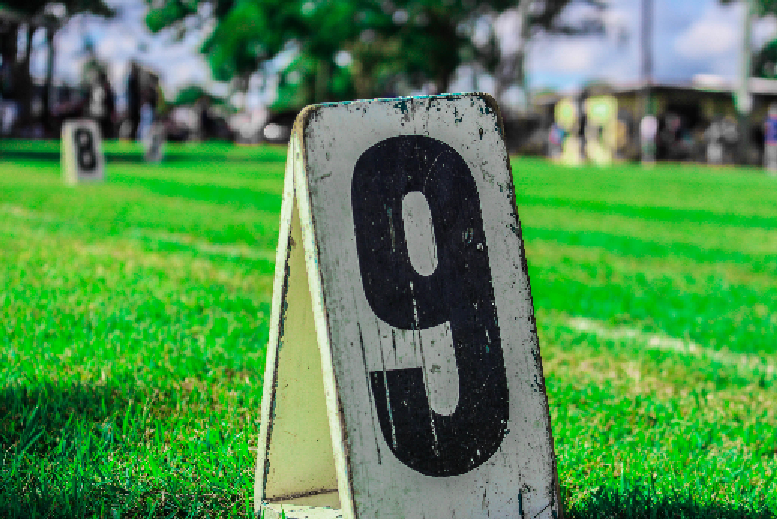

In [23]:
img_resized_2 = cv2.resize(img_resized,None,fx=1.5,fy=1.5,interpolation=cv2.INTER_NEAREST)
print(img_resized_2.shape)
cv2_imshow(img_resized_2)

## ノック６７：画像を回転させてみよう

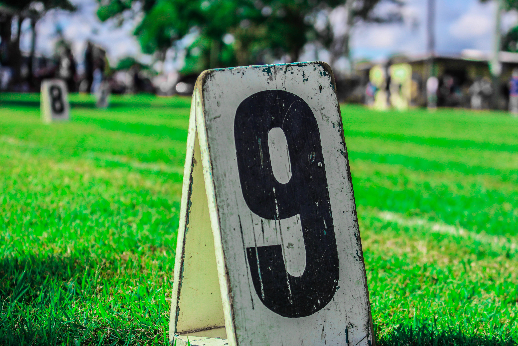

(346, 518, 3)


In [24]:
cv2_imshow(img_resized)
print(img_resized.shape)

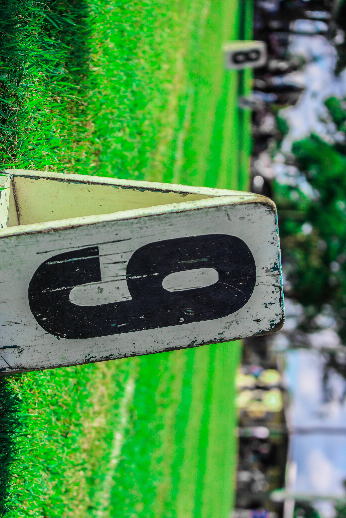

(518, 346, 3)


In [25]:
img_rotated = cv2.rotate(img_resized,cv2.ROTATE_90_CLOCKWISE)
cv2_imshow(img_rotated)
print(img_rotated.shape)

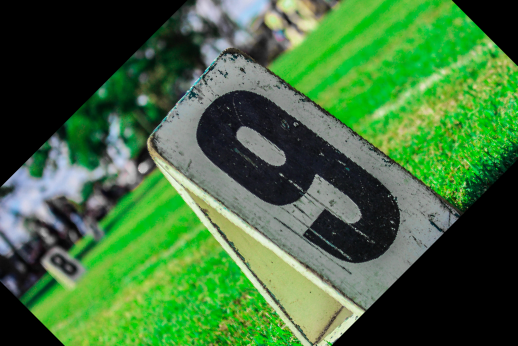

(346, 518, 3)


In [27]:
height,width = img_resized.shape[:2]
center = (int(width/2),int(height/2))

rot = cv2.getRotationMatrix2D(center,45,1)
img_rotated = cv2.warpAffine(img_resized,rot,(width,height))
cv2_imshow(img_rotated)
print(img_rotated.shape)

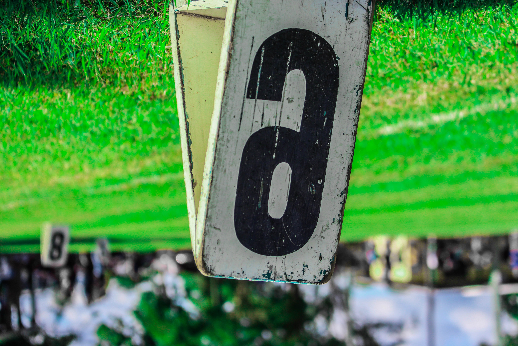

(346, 518, 3)


In [28]:
img_reverse = cv2.flip(img_resized,0)
cv2_imshow(img_reverse)
print(img_reverse.shape)

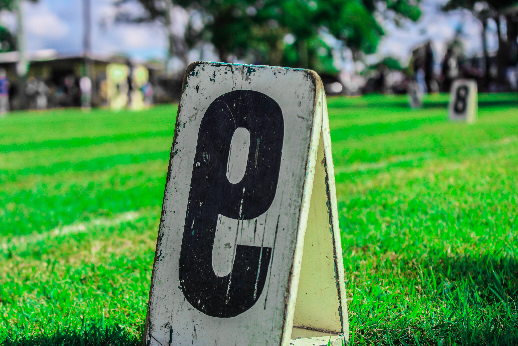

(346, 518, 3)


In [29]:
img_reverse = cv2.flip(img_resized,1)
cv2_imshow(img_reverse)
print(img_reverse.shape)

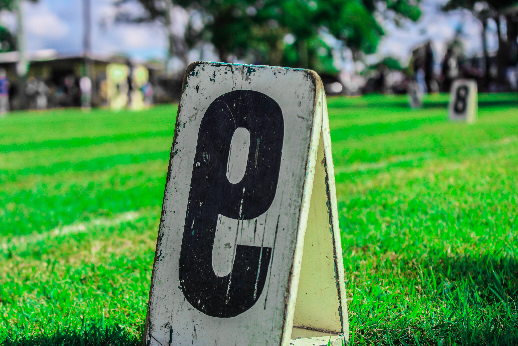

(346, 518, 3)


In [30]:
img_reverse = img_resized[:,::-1,:]
cv2_imshow(img_reverse)
print(img_reverse.shape)

## ノック６８：画像処理をしてみよう

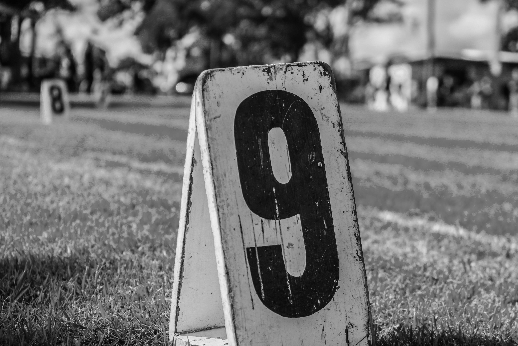

(346, 518)


In [31]:
img_gray =cv2.cvtColor(img_resized,cv2.COLOR_BGR2GRAY)
cv2_imshow(img_gray)
print(img_gray.shape)

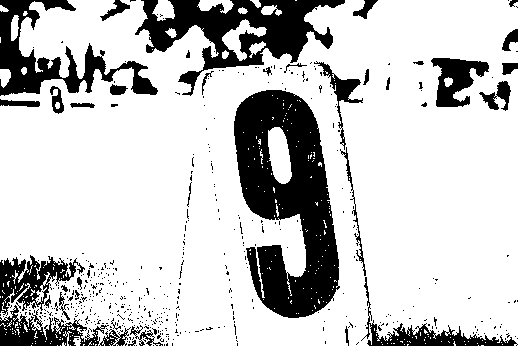

(346, 518)
60.0


In [32]:
th,img_th = cv2.threshold(img_gray,60,255,cv2.THRESH_BINARY)
cv2_imshow(img_th)
print(img_th.shape)
print(th)

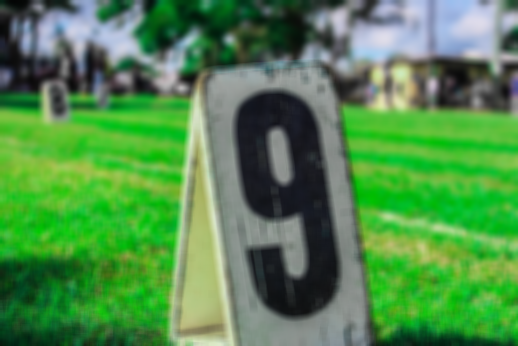

(346, 518, 3)


In [33]:
img_smoothed = cv2.blur(img_resized,(8,8))
cv2_imshow(img_smoothed)
print(img_smoothed.shape)

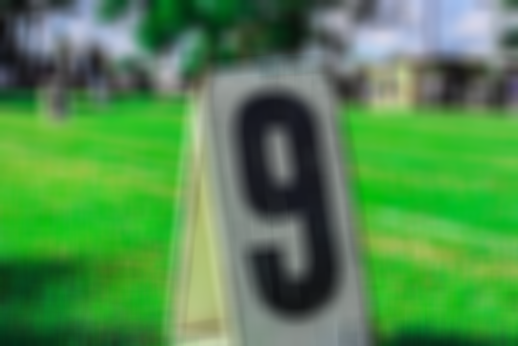

(346, 518, 3)


In [34]:
img_smoothed = cv2.blur(img_resized,(20,20))
cv2_imshow(img_smoothed)
print(img_smoothed.shape)

## ノック６９：画像にテキストや線を描画してみよう

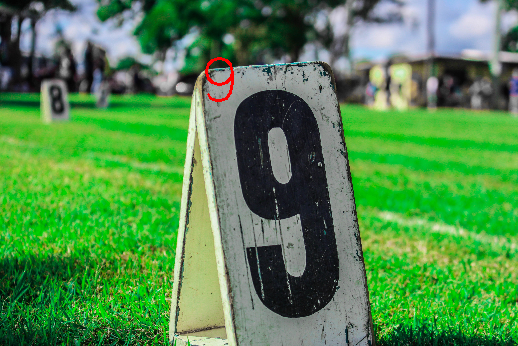

In [35]:
text = '9'
xy = (200,100)
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 2
color = (0,0,255)
thickness = 2

img_text = cv2.putText(img_resized.copy(),text,xy,font,font_scale,color,thickness)
cv2_imshow(img_text)

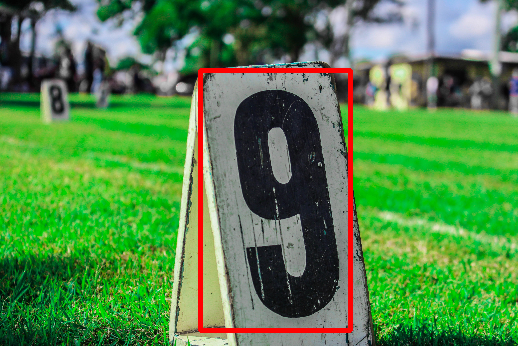

In [36]:
x0,y0 = 200,70
x1,y1 = 350,330
color = (0,0,255)
thickness = 3

img_rect = cv2.rectangle(img_resized.copy(),(x0,y0),(x1,y1),color,thickness)
cv2_imshow(img_rect)

## ノック７０：画像を保存してみよう

In [37]:
cv2.imwrite('data/sample_resized.jpg',img_resized)

True

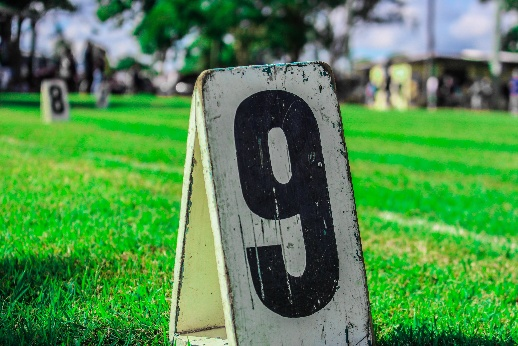

(346, 518, 3)


In [38]:
img_read = cv2.imread('data/sample_resized.jpg')
cv2_imshow(img_read)
print(img_read.shape)

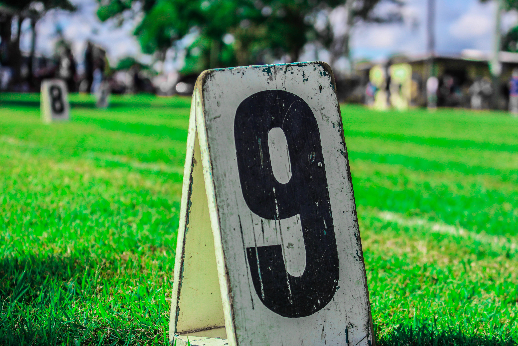

(346, 518, 3)


In [39]:
cv2.imwrite('data/sample_resized.png',img_resized)
img_read = cv2.imread('data/sample_resized.png')
cv2_imshow(img_read)
print(img_read.shape)